In [ ]:
import os
import random
import requests
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import pos_tag
from gensim import corpora
from gensim.models.ldamodel import LdaModel
from gensim.models import FastText
from sklearn.cluster import KMeans
import numpy as np
import spacy
import string
from wordcloud import WordCloud
import unicodedata
import matplotlib.pyplot as plt
from collections import Counter
from nltk.util import ngrams

# Load your custom FastText model
fasttext_model_path = 'fasttext_300dim_20epochs.model'
fasttext_model = FastText.load(fasttext_model_path)

# Folder paths
transcripts_folder_path = 'cleaned_transcripts/'
tags_folder_path = 'tags/'

In [2]:
# Function to load random documents
def load_random_documents(folder_path, sample_size=20):
    all_files = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.txt')]
    sampled_files = random.sample(all_files, min(sample_size, len(all_files)))

    documents = []
    file_names = []
    for file_name in sampled_files:
        with open(os.path.join(folder_path, file_name), 'r', encoding='utf-8') as file:
            content = file.read().lower()
            if len(content.split()) >= 100:
                documents.append(content)
                file_names.append(file_name)
    return documents, file_names

documents, file_names = load_random_documents(transcripts_folder_path)

# Function to load video tags
def load_video_tags(folder_path):
    video_tags = {}
    for file_name in os.listdir(folder_path):
        if file_name.endswith('.txt'):
            video_id = file_name.split('_')[0]
            with open(os.path.join(folder_path, file_name), 'r', encoding='utf-8') as file:
                tags_content = file.read().lower()
                video_tags[video_id] = tags_content.split()
    return video_tags

video_tags = load_video_tags(tags_folder_path)

# Fetch stopwords
def fetch_stopwords_from_github(url):
    response = requests.get(url)
    return set(response.text.splitlines())

github_stopwords_url = 'https://raw.githubusercontent.com/stopwords-iso/stopwords-en/master/stopwords-en.txt'
github_stopwords = fetch_stopwords_from_github(github_stopwords_url)

stop_words = set(stopwords.words('english'))
custom_stop_words = ['like', 'yeah', 'know', 'um', 'uh', 'really', 'one', 'go', 'right', 'okay', 'well', 'said', 
                     'going', 'got', 'na', 'always', 'every', 'each', 'say', 'el', 'little', 'still', 
                     'best', 'dutch', 'nice', 'great', 'awesome', 'good', 'cool', 'love', 'amazing', 'wow' ]
broad_terms = ['philippines', 'philippine', 'british', 'filipino', 'video', 'http', 'korea', 'korean', 
               'youtube', 'google', 'united', 'america', 'american']
kpop_keywords = ['kpop', '필리핀', 'bts', 'blackpink', 'twice', 'exo', 'k-pop', 'seventeen', 
                 'stray kids', 'nct', 'kdrama', 'aespa', 'taehyung', 'jimin', 'jungkook']
more_keywords = [
    'breaking news', 'report', 'coverage', 'investigation', 'interview', 'documentary', 'news', 'netherlands', 'psy', 'subtitle', 'description', 'link', 
    'journalist', 'headline', 'reporter', 'current events', 'special report', 
    'analysis', 'documented', 'broadcast', 'reporting', 'v', 'food', 'travel', 'react', 
    'reacts', 'reaction', 'foreigner', 'thing', 'visit', 'dc', 'japan', 'first', 'fast', 
    'asia', 'ang', 'indian', 'thai', 'vietnamese', 'russia', 'gon', 'canada', 'canadian', 'russian', 
    'russia', 'guy', 'lot', 'bit', 'diba', 'ola', 'cuz', 'thai', 'thailand', 'person', 'citizen', 'foreigner', 'foreign', 'foreigners',
    'facebook', 'filipinos', 'filipinas', 'vlog', 'vlogs', 'vlogging', 'hashtag', 'india', 'bro', 'dito', 'people', 'time', 'music', 'gonna', 'life', 
    'lol', 'guys', 'tho', 'cute', 'hmm', 'huh', 'channel', 'subscribe', 'day6', 'mandarin', 'chinese', 'beautiful',
    'chuckles', 'fbe', 'hit', 'laughs', 'yo', 'ka', 'word', 'living', 'boi', 'minimum', 'ya', 'successful', 'perfectly', 'yeap', 
    'wondering', 'fantastic', 'hurry', 'german', 'age', 'country', 'subscribing', 'bluesy', 'jump', 'pretty', 'understanding', 'personalized',
    'and', 'the', 'to', 'of', 'in', 'for', 'on', 'with', 'at', 'by', 'from', 'up', 'about', 'over', 'into', 'through', 'between', 'under', 'against', 'all',
    'you', 'haha', 'hahaha', 'ha', 'hey', 'bye', 'hello', 'hi', 'oh', 'blah', 'easy', 'alright', 'ta', 'day', 'ooh', 'en', 'do', 'lot', 'comment', 'notification', 
    'korean', 'jjajangmyeon', 'jajangmyeon', 'damn', 'yall', 'month', 'week', 'year', 'ohhh', 'pvf', 'dude', 'mmm', 'kagilagilalas', 'ofcourse', 'australia', 'uxo', 
    'atleast', 'yusuf', 'bangkok', 'ot', 'anytime', 'allover', 'kala', 'nope', 'wan', 'brazil', 'smooth', 'ot', 'timeshere', 'batchof', 'yep', 'opo', 'del',
    'gosh', 'po', 'ourself', 'wo', 'wait', 'ugh', 'nyc', 'whoa', 'nicaragua', 'yup', 'em', 'bout', 'le', 'omg', 'overwhelm', 'maam', 'nicer', 'haha', 'hahaha', 'ha', 
    'nbcs', 'lana', 'rc', 'whatsoever', 'oxy', 'decade', 'whyd', 'unknown', 'ahhhhh', 'ohoh', 'ohto', 'ohhhh', 'bruh', 'ooe', 'ahmedabad', 'mexico', 
    'understand', 'excuse', 'kinda', 'applause', 'oooh', 'thiswhat', 'nevermind', 'ahh', 'againthank', 'toto', 'aww', 'nah', 'bbmas', 'ay', 'op', 'huh', 'huhu',
    'tada', 'beacuse', 'voila', 'upstairs', 'thatswhy', 'yea', 'that', 'armenia', 'or', 'not', 'funwhat', 'aka', 'armeniathat', 'woosexy', 'worth', 'laugh', 'box', 
    'xd', 'vb', 'eff', 'ananya', 'welsh', 'latron', 'shout', 'whatwhat', 'what', 'pause', 'why', 'thats', 'byebye', 'iv', 'bye', 'ado', 'ownup', 'dom', 'jomm', 'sir', 
    'budgie', 'nomac', 'lavocha', 'germany', 'why', 'walang', 'superduper', 'philip', 'mom', 'jre', 'giddy', 'intro', 'dupe', 'europe', 'dream', 'team', 'dislike', 'content', 
    'yoongi', 'royale', 'ilu', 'jhope', 'day', 'jin', 'ecc', 'nyhs', 'nego', 'chavez', 'pb', 'everyones', 'epic', 'matter', 'oneonone', 'region', 'change', 'ho', 'seetoh', 
    'atin', 'vpn', 'facetune', 'busu', 'mackie', 'clyd', 'china', 'rest', 'friend', 'woah', 'dindins', 'poster', 'vibe', 'woman', 'boss', 'woah', 'type', 'mahana', 'joke', 
    'taller', 'insane', 'whang', 'psa', 'manatee', 'recommend', 'caesar', 'mmmhmm', 'mosul', 'dun', 'clue', 'naysayer', 'hindi', 'ko', 'pero', 'bulgaria', 'question', 'video', 
    'yobi', 'hindu', 'expat', 'option', 'gap', 'eu', 'simo', 'kouignamann', 'bct', 'month', 'cfo'
]
stop_words.update(custom_stop_words, kpop_keywords, broad_terms, more_keywords, github_stopwords)

lemmatizer = WordNetLemmatizer()

# Update the `is_filipino_word` function to use the custom FastText model
def is_filipino_word(word):
    # Check if the word exists in the FastText model's vocabulary
    if word in fasttext_model.wv:
        embedding = fasttext_model.wv[word]
        return np.linalg.norm(embedding) >= 0.85  # Adjust threshold as needed
    else:
        return False

# Helper function to check if a word contains only Latin script characters
def is_latin_script(word):
    for char in word:
        if not ('LATIN' in unicodedata.name(char, '') or char.isdigit()):
            return False
    return True

# Function to preprocess text with tags, removing non-Latin characters and applying n-gram weighting
def preprocess_text_with_tags(doc, video_id, ngram_range=(1, 2), tag_weight=1, filipino_weight=1, ngram_weight_factor=1):
    doc = doc.lower().translate(str.maketrans('', '', string.punctuation))
    tokens = word_tokenize(doc)
    tokens_with_pos = pos_tag(tokens)

    # Step 1: Generate n-grams (bigrams and trigrams)
    ngram_tokens = []
    for n in range(ngram_range[0], ngram_range[1] + 1):
        ngram_tokens.extend([' '.join(gram) for gram in ngrams(tokens, n)])

    # Step 2: Count frequency of n-grams
    ngram_frequencies = Counter(ngram_tokens)

    # Step 3: Filter tokens based on part-of-speech, stop words, and non-Latin characters
    filtered_tokens = []
    for word, pos in tokens_with_pos:
        if not word.isalpha() or not is_latin_script(word) or word in stop_words:
            continue
        if pos in ['VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ', 'JJ', 'JJR', 'JJS', 'RB', 'RBR', 'RBS']:
            continue
        lemmatized_word = lemmatizer.lemmatize(word)
        filtered_tokens.append(lemmatized_word)

    # Step 4: Assign weight to tokens based on their frequency in n-grams
    weighted_tokens = []
    for token in filtered_tokens:
        # If token is part of a frequent n-gram, give extra weight
        token_weight = 1
        if token in ngram_frequencies:
            token_weight = 1 + ngram_frequencies[token] * ngram_weight_factor  # Increase weight for frequent n-grams
        if is_filipino_word(token):
            weighted_tokens.extend([token] * filipino_weight * token_weight)
        else:
            weighted_tokens.extend([token] * token_weight)

    # Step 5: Add tags from video_tags and apply extra weight to Filipino tags
    if video_id in video_tags:
        tags = video_tags[video_id]
        for tag in tags:
            if tag.isalpha() and is_latin_script(tag):
                tag_weight_multiplier = tag_weight
                if is_filipino_word(tag):
                    tag_weight_multiplier *= filipino_weight
                weighted_tokens.extend([tag] * tag_weight_multiplier)

    return ' '.join(weighted_tokens)

# Function to calculate the number of topics dynamically
def dynamic_num_topics(preprocessed_doc, words_per_topic=100, min_topics=1, max_topics=5):
    num_tokens = len(preprocessed_doc.split())
    return max(min_topics, min(num_tokens // words_per_topic, max_topics))

# Dictionary to store preprocessed documents mapped to video IDs
preprocessed_docs = {}

Processing file: ZvRGNzNuUx8_captions.txt
Processing file: _jiVtXsfupo_captions.txt
Processing file: gca99X5zCuE_captions.txt
Processing file: jQaxzqZztNM_captions.txt
Processing file: 8X_d-IVydP4_captions.txt
Processing file: bi__9Vzhnc4_captions.txt
Processing file: pQqcWZCvt1o_captions.txt
Processing file: p5hF3mbtswo_captions.txt
Processing file: Ux-54H76Deo_captions.txt
Processing file: 6ndkOSiGOe4_captions.txt
Processing file: fkOld9v1k9c_captions.txt
Processing file: H8yvD6Rgz44_captions.txt
Processing file: 1Ucsm6J24Us_captions.txt
Processing file: jPUSclSyUiQ_captions.txt
Processing file: pqEiNd-BodQ_captions.txt
Processing file: nMmYXQGZ_LM_captions.txt
Processing file: bTLMJvuPbZc_captions.txt
Processing file: _AWKKCUJnk0_captions.txt


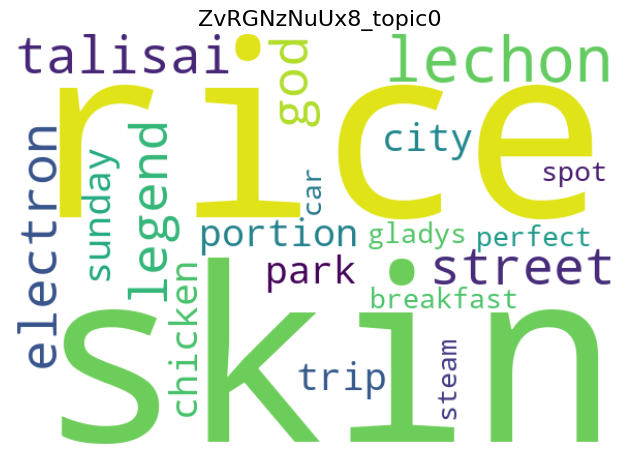

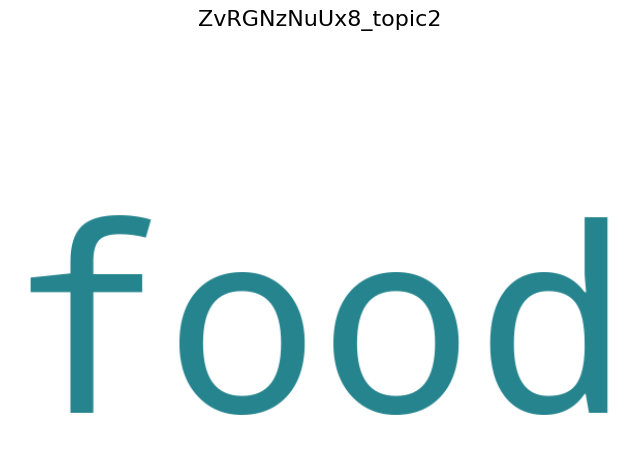

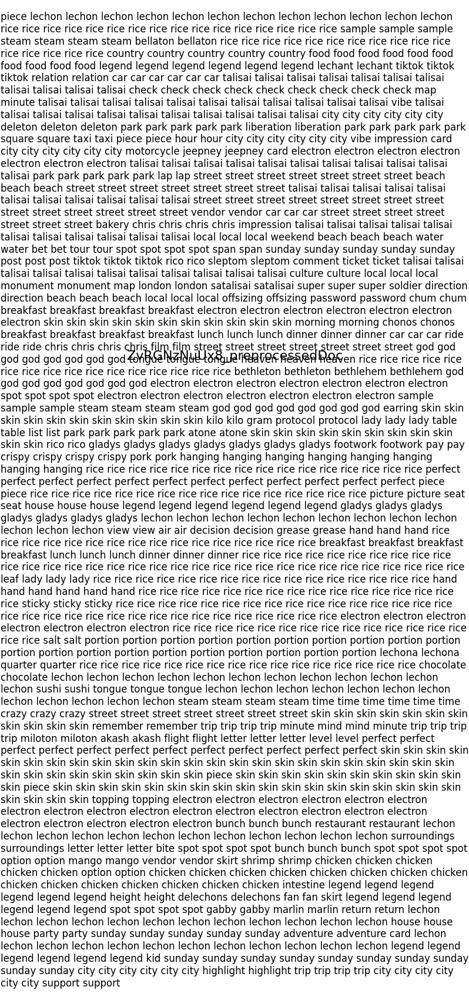

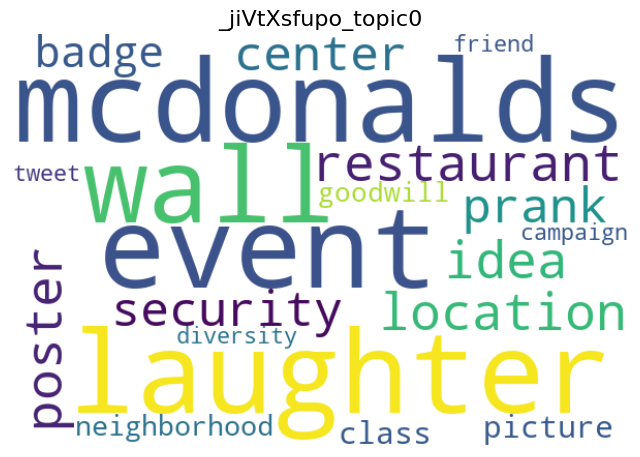

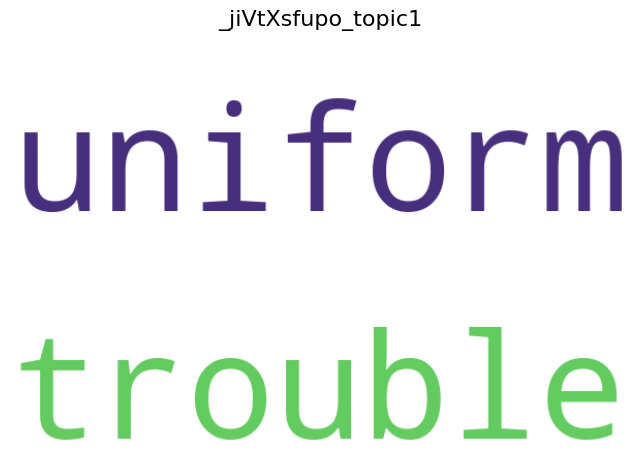

...

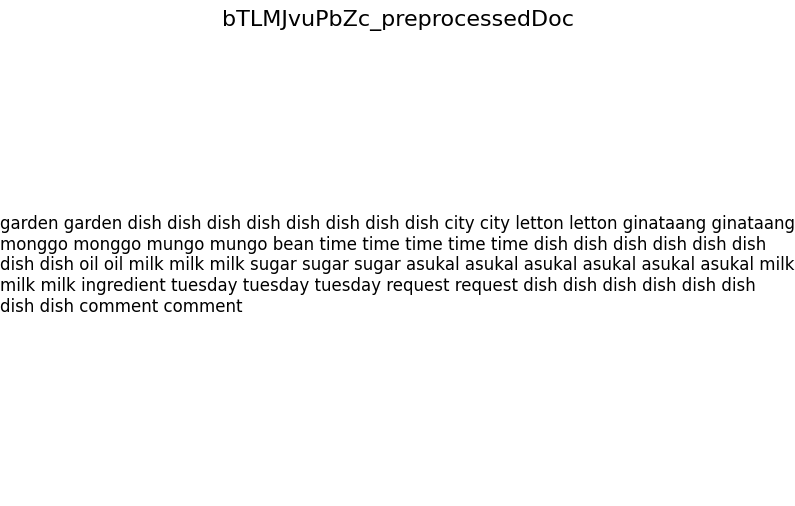

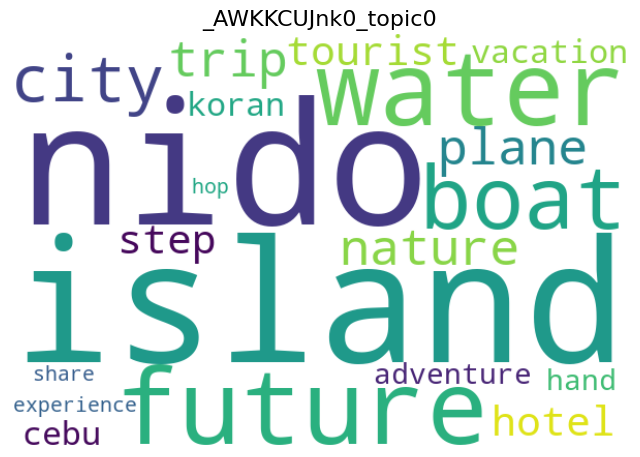

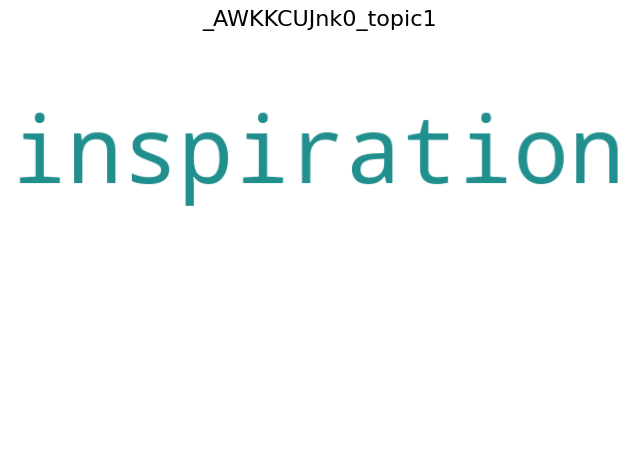

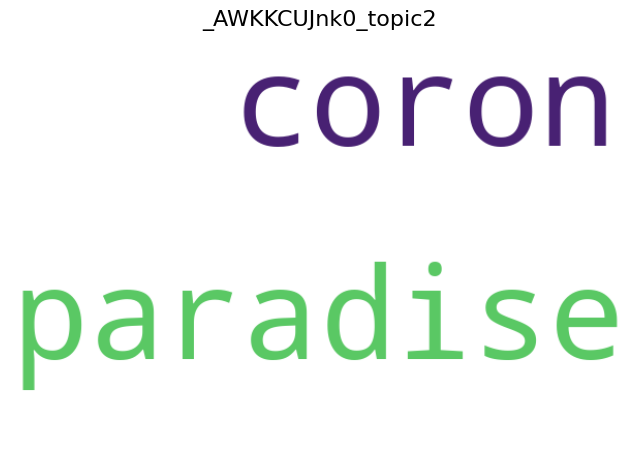

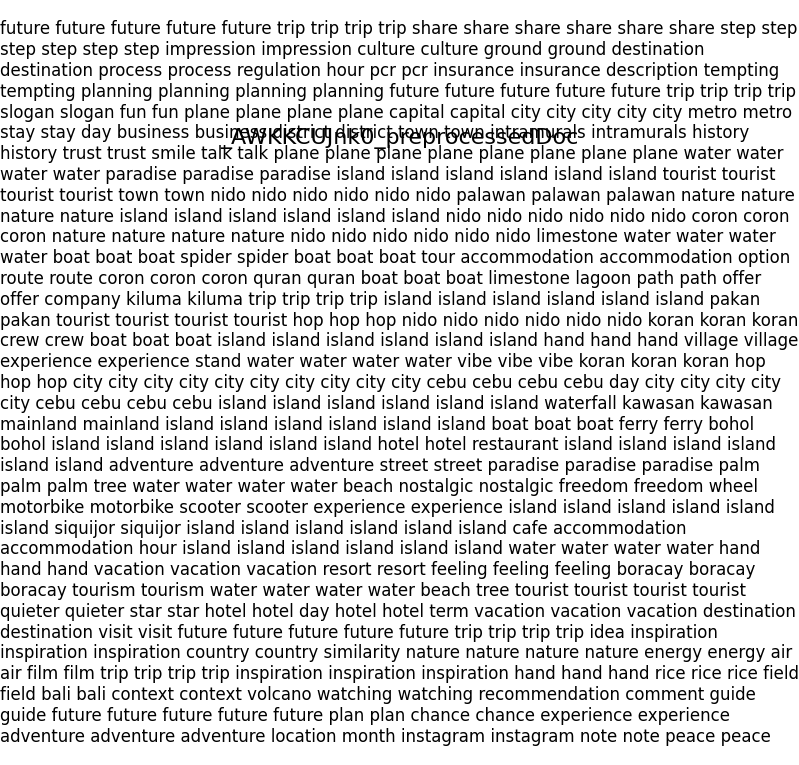

In [3]:
# LDA topic modeling
lda_models = []
topic_vectors = []

for i, doc in enumerate(documents):
    video_id = file_names[i].split('_captions')[0]
    print(f"Processing file: {file_names[i]}")

    preprocessed_doc = preprocess_text_with_tags(doc, video_id)
    preprocessed_docs[video_id] = preprocessed_doc

    if len(preprocessed_doc) > 0:
        dictionary = corpora.Dictionary([preprocessed_doc.split()])
        corpus = [dictionary.doc2bow(preprocessed_doc.split())]
        
        num_topics = dynamic_num_topics(preprocessed_doc, words_per_topic=100, min_topics=1, max_topics=5)
        #print(f"Number of topics for {video_id}: {num_topics}")

        lda_model = LdaModel(corpus, num_topics=num_topics, id2word=dictionary, eta='auto', alpha='auto', passes=50, random_state=42)
        lda_models.append(lda_model)

        topic_distribution = lda_model.get_document_topics(corpus[0], minimum_probability=0)
        topic_vector = [prob for _, prob in topic_distribution]
        topic_vectors.append(topic_vector)


# Function to filter repeated words across topics
def filter_repeated_words_across_topics(lda_model, num_words=20):
    """
    Filters repeated words across topics for a single document.
    Ensures each word appears in only one topic.

    Args:
        lda_model: Trained LDA model for a document.
        num_words: Number of top words to consider per topic.

    Returns:
        filtered_topics: List of filtered topics where words don't repeat.
    """
    topics = lda_model.show_topics(num_words=num_words, formatted=False)
    used_words = set()
    filtered_topics = []

    for t, words in topics:
        filtered_words = []
        for word, prob in words:
            if word not in used_words:
                filtered_words.append((word, prob))
                used_words.add(word)
        filtered_topics.append((t, filtered_words))

    return filtered_topics

# Function to display WordCloud and preprocessed document content separately
def display_wordcloud_and_preprocessed_doc(lda_model, preprocessed_doc, video_id, num_words=20):
    """
    Displays WordCloud and preprocessed document for each topic in the LDA model.
    
    Args:
        lda_model: Trained LDA model.
        preprocessed_doc: Preprocessed document content.
        video_id: Identifier for the video/document.
        num_words: Number of top words to consider for WordCloud.
    """
    # Filter out repeated words across topics
    filtered_topics = filter_repeated_words_across_topics(lda_model, num_words=num_words)
    
    for t, words in filtered_topics:
        if not words:  # Skip if no words to plot
            continue

        # Generate word frequency dictionary for the WordCloud
        word_freq = {word[0]: word[1] for word in words}
        wordcloud = WordCloud(width=600, height=400, background_color="white").generate_from_frequencies(word_freq)
        
        # Display the WordCloud
        plt.figure(figsize=(8, 6))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"{video_id}_topic{t}", fontsize=16)
        plt.show()
        
    # Display the preprocessed document
    plt.figure(figsize=(8, 6))
    plt.text(0.5, 0.5, preprocessed_doc, fontsize=12, wrap=True, ha='center', va='center', multialignment='left')
    plt.axis("off")
    plt.title(f"{video_id}_preprocessedDoc", fontsize=16)
    plt.show()

# Generate and display WordClouds with preprocessed documents
for i, lda_model in enumerate(lda_models):
    video_id = file_names[i].split('_captions')[0]
    display_wordcloud_and_preprocessed_doc(lda_model, preprocessed_docs[video_id], video_id)

In [2]:
import spacy
import string
import os
import random
from nltk.tokenize import word_tokenize
from gensim.models import FastText
import numpy as np

# Load your custom FastText model
fasttext_model_path = 'fasttext_100dim_20epochs.model'
try:
    fasttext_model = FastText.load("fasttext_300dim_20epochs.model")
    print("FastText model loaded successfully.")
    
    # Check if the model contains vocabulary
    if fasttext_model.wv:
        print("Vocabulary loaded successfully.")
    else:
        print("No vocabulary found in the model.")
    
    # Test with a sample word
    test_word = 'bahay'  # Example Filipino word
    if test_word in fasttext_model.wv:
        print(f"Embedding for '{test_word}': {np.linalg.norm(fasttext_model.wv[test_word])}")
    else:
        print(f"Word '{test_word}' not found in the model's vocabulary.")
except Exception as e:
    print(f"Error loading FastText model: {e}")

# Folder paths
transcripts_folder_path = 'cleaned_transcripts/'
output_folder_path = 'filipino_word_results/'


FastText model loaded successfully.
Vocabulary loaded successfully.
Embedding for 'bahay': 33.18235397338867


In [ ]:
# Function to load random documents
def load_random_documents(folder_path, sample_size=5):
    all_files = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.txt')]
    sampled_files = random.sample(all_files, min(sample_size, len(all_files)))

    documents = []
    file_names = []
    for file_name in sampled_files:
        with open(os.path.join(folder_path, file_name), 'r', encoding='utf-8') as file:
            content = file.read().lower()
            if len(content.split()) >= 100:
                documents.append(content)
                file_names.append(file_name)
    return documents, file_names

# Function to check if a word is a Filipino word
def is_filipino_word(word):
    # Check if the word exists in the FastText model's vocabulary
    if word in fasttext_model.wv:
        embedding = fasttext_model.wv[word]
        print(f"Embedding for '{word}': {np.linalg.norm(embedding)}")
        return np.linalg.norm(embedding) >= 15  # Adjust threshold as needed
    else:
        return False

# Function to process and save the Filipino word identification result
def process_and_save_filipino_words(documents, file_names):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    for doc, file_name in zip(documents, file_names):
        doc = doc.lower().translate(str.maketrans('', '', string.punctuation))
        tokens = word_tokenize(doc)
        filipino_results = []

        # Check each token
        for token in tokens:
            filipino_results.append(f"{token}: {'Filipino' if is_filipino_word(token) else 'Not Filipino'}")

        # Save results to a file named after the video ID (using the file_name or a derived ID)
        video_id = file_name.split('.')[0]  # Assuming file name represents video ID
        output_file_path = os.path.join(output_folder_path, f"{video_id}.txt")
        
        with open(output_file_path, 'w', encoding='utf-8') as output_file:
            output_file.write("\n".join(filipino_results))

# Load random documents
documents, file_names = load_random_documents(transcripts_folder_path)

# Process and save the Filipino word identification results
process_and_save_filipino_words(documents, file_names)

Embedding for 'all': 43.54607009887695
Embedding for 'right': 22.30443572998047
Embedding for 'everybody': 13.467888832092285
Embedding for 'this': 38.167877197265625
Embedding for 'is': 76.23001861572266
Embedding for 'bobbied': 12.864368438720703
Embedding for 'your': 35.640663146972656
Embedding for 'favorite': 15.87524700164795
Embedding for 'person': 23.754146575927734
Embedding for 'in': 80.32140350341797
Embedding for 'the': 68.7969741821289
Embedding for 'philippines': 19.97357177734375
Embedding for 'coming': 25.091312408447266
Embedding for 'to': 70.62675476074219
Embedding for 'you': 49.093448638916016
Embedding for 'live': 32.601356506347656
Embedding for 'from': 34.68862533569336
Embedding for 'cebu': 30.578170776367188
Embedding for 'philippines': 19.97357177734375
Embedding for 'im': 60.072853088378906
Embedding for 'having': 21.55101776123047
Embedding for 'an': 69.44633483886719
Embedding for 'awesome': 11.244781494140625
Embedding for 'time': 33.15074920654297
Embeddi

In [1]:
import spacy
import string
import os
import random
import numpy as np
from nltk.tokenize import word_tokenize

# Folder paths
transcripts_folder_path = 'cleaned_transcripts/'
output_folder_path = 'filipino_word_results/'


# Load the Filipino FastText model
nlp = spacy.load("tl_fasttext_transition")
# Function to load random documents
def load_random_documents(folder_path, sample_size=10):
    all_files = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.txt')]
    sampled_files = random.sample(all_files, min(sample_size, len(all_files)))

    documents = []
    file_names = []
    for file_name in sampled_files:
        with open(os.path.join(folder_path, file_name), 'r', encoding='utf-8') as file:
            content = file.read().lower()
            if len(content.split()) >= 100:
                documents.append(content)
                file_names.append(file_name)
    return documents, file_names


# Identify Filipino words using SpaCy model
def is_filipino_word(word):
    doc = nlp(word)
    embedding = doc.vector
    return np.linalg.norm(embedding) > 10  # Adjust threshold as needed


# Function to process and save the Filipino word identification result
def process_and_save_filipino_words(documents, file_names):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    for doc, file_name in zip(documents, file_names):
        doc = doc.lower().translate(str.maketrans('', '', string.punctuation))
        tokens = word_tokenize(doc)
        filipino_results = []

        # Check each token
        for token in tokens:
            filipino_results.append(f"{token}: {'Filipino' if is_filipino_word(token) else 'Not Filipino'}")

        # Save results to a file named after the video ID (using the file_name or a derived ID)
        video_id = file_name.split('.')[0]  # Assuming file name represents video ID
        output_file_path = os.path.join(output_folder_path, f"{video_id}.txt")
        
        with open(output_file_path, 'w', encoding='utf-8') as output_file:
            output_file.write("\n".join(filipino_results))

# Load random documents
documents, file_names = load_random_documents(transcripts_folder_path)

# Process and save the Filipino word identification results
process_and_save_filipino_words(documents, file_names)

In [1]:
import os
import random
import string
import numpy as np
import nlu  # Import John Snow Labs NLP (NLU)
from nltk.tokenize import word_tokenize

# Folder paths
transcripts_folder_path = 'cleaned_transcripts/'
output_folder_path = 'filipino_word_results_week5/'

# Load the Filipino Word2Vec model using NLU
nlu_model = nlu.load("tl.embed.w2v_cc_300d")

# Function to load random documents
def load_random_documents(folder_path, sample_size=1):
    all_files = [file_name for file_name in os.listdir(folder_path) if file_name.endswith('.txt')]
    sampled_files = random.sample(all_files, min(sample_size, len(all_files)))

    documents = []
    file_names = []
    for file_name in sampled_files:
        with open(os.path.join(folder_path, file_name), 'r', encoding='utf-8') as file:
            content = file.read().lower()
            if len(content.split()) >= 100:
                documents.append(content)
                file_names.append(file_name)
    return documents, file_names

# Function to get Filipino word embeddings using NLU
def get_filipino_word_embeddings(documents):
    filipino_words = set()  # Store identified Filipino words

    for doc in documents:
        result = nlu_model.predict(doc)  # Get word embeddings
        tokens = result["token"]  # Extract tokenized words
        embeddings = result["word_embeddings"]  # Extract word vectors

        for token, embedding in zip(tokens, embeddings):
            if np.linalg.norm(embedding) >= 0.50:  # Adjust threshold as needed
                filipino_words.add(token)

    return filipino_words

# Function to process and save the Filipino word identification result
def process_and_save_filipino_words(documents, file_names):
    if not os.path.exists(output_folder_path):
        os.makedirs(output_folder_path)

    # Identify Filipino words using NLU embeddings
    filipino_words = get_filipino_word_embeddings(documents)

    for doc, file_name in zip(documents, file_names):
        doc = doc.lower().translate(str.maketrans('', '', string.punctuation))
        tokens = word_tokenize(doc)
        filipino_results = [f"{token}: {'Filipino' if token in filipino_words else 'Not Filipino'}" for token in tokens]

        # Save results to a file named after the video ID (using the file_name or a derived ID)
        video_id = file_name.split('.')[0]  # Assuming file name represents video ID
        output_file_path = os.path.join(output_folder_path, f"{video_id}.txt")

        with open(output_file_path, 'w', encoding='utf-8') as output_file:
            output_file.write("\n".join(filipino_results))

# Load random documents
documents, file_names = load_random_documents(transcripts_folder_path)

# Process and save the Filipino word identification results
process_and_save_filipino_words(documents, file_names)


KeyboardInterrupt: 

In [12]:
pip install hadoop


Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement hadoop (from versions: none)

[notice] A new release of pip is available: 24.3.1 -> 25.0
[notice] To update, run: python.exe -m pip install --upgrade pip
ERROR: No matching distribution found for hadoop
